In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

import numpy as np
import matplotlib.pyplot as pyp
import plc_network

from mdct_funcs import *
from scipy.io import wavfile
from scipy.signal import lfilter, sosfilt, tf2sos 

import IPython
import glob

2022-07-25 20:12:29.935530: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64/openmpi/lib/:/usr/local/cuda/lib64:/usr/local/lib:/usr/lib:/usr/local/cuda/extras/CUPTI/lib64:/usr/local/mpi/lib:/lib/:/home/ubuntu/src/cntk/bindings/python/cntk/libs:/usr/local/cuda/lib64:/usr/local/lib:/usr/lib:/usr/local/cuda/extras/CUPTI/lib64:/usr/local/mpi/lib::/home/ubuntu/miniconda3/lib/
2022-07-25 20:12:29.935566: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
band_defs = np.array([0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 12, 14, 16, 20, 24, 28, 34, 40, 48, 60, 78, 100])*8
ebandMeans = np.array([
      6.437500, 6.250000, 5.750000, 5.312500, 5.062500,
      4.812500, 4.500000, 4.375000, 4.875000, 4.687500,
      4.562500, 4.437500, 4.875000, 4.625000, 4.312500,
      4.500000, 4.375000, 4.625000, 4.750000, 4.437500,
      3.750000, 3.750000, 3.750000, 3.750000, 3.750000
]).astype('float')

### Testing Python Synthesis code
1. Extract MDCT using CELT and Python code
2. Invert both using python code
3. Compare inverted waveforms

Things to take care off- Pre/De-emphasis, DC filtering, Zeroing out coefficients 800-960, correct normalization, zero-padding

In [3]:
# Extracting MDCTs using Python code
original_audio = np.fromfile("../../datasets/spe48.sw",dtype='short').astype('float32')
emph_audio = sosfilt(tf2sos([1,-0.85],[1]),original_audio)
zpog_python = np.concatenate((np.zeros(540),emph_audio))
ee_python,mm_python = mdct2bands(mdct_ola(zpog_python,960*2,480*2),band_defs)

In [4]:
# Loading CELT MDCTs
ee_celt = np.fromfile("../../datasets/debug_bandE",dtype='float32')
mm_celt = np.fromfile("../../datasets/debug_mdctnormalized",dtype='float32')

sequence_size_shape = 1
nb_features_cepstral = 960
nb_features = 21
nb_sequences_shape = len(mm_celt)//(nb_features_cepstral*sequence_size_shape)
nb_sequences_E = len(ee_celt)//(nb_features*sequence_size_shape)

mm_celt = mm_celt[:nb_sequences_shape*sequence_size_shape*nb_features_cepstral]
mm_celt = np.reshape(mm_celt, (nb_sequences_shape, sequence_size_shape, nb_features_cepstral))
mm_celt = mm_celt[:(int)(1*nb_sequences_shape), :, :800]
mm_celt = np.concatenate((mm_celt.squeeze(),np.zeros((mm_celt.shape[0],160))),axis = -1)
mm_celt = mm_celt.squeeze()

ee_celt = ee_celt[:nb_sequences_E*sequence_size_shape*nb_features]
ee_celt = np.reshape(ee_celt, (nb_sequences_E, sequence_size_shape, nb_features))
ee_celt = ee_celt[:(int)(1*nb_sequences_E), :, :]
ee_celt = ee_celt.squeeze()

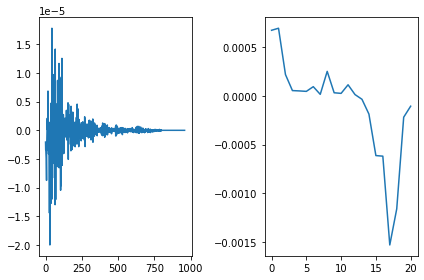

In [5]:
ind = 1000
pyp.subplot(1,2,1)
pyp.plot(mm_python.squeeze()[ind] - mm_celt.squeeze()[ind])
pyp.subplot(1,2,2)
pyp.plot(ee_python.squeeze()[ind] - ee_celt.squeeze()[ind])
pyp.tight_layout()

In [6]:
# Reconstructing waveforms using Python code
mdct_test_opus =  mdctbands2mdct(mm_celt,ee_celt,band_defs)
recon_test_opus = imdct_ola(mdct_test_opus,960*2,480*2,mdct_test_opus.shape[0]*960)
recon_test_opus = sosfilt(tf2sos([1],[1,-0.85]),recon_test_opus)

mdct_test_python =  mdctbands2mdct(mm_python,ee_python,band_defs)
recon_test_python = imdct_ola(mdct_test_python,960*2,480*2,mdct_test_python.shape[0]*960)
recon_test_python = sosfilt(tf2sos([1],[1,-0.85]),recon_test_python)

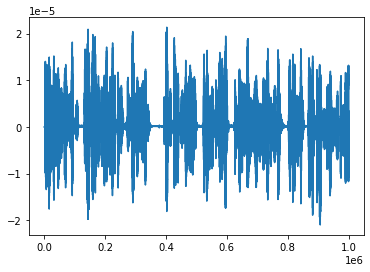

In [7]:
pyp.plot((recon_test_python[:1000000] - recon_test_opus[:1000000])/32768)
# print(np.abs(recon_test_python).max())

## Network Reconstruction Experiments

Loss Minima at Epoch :  9


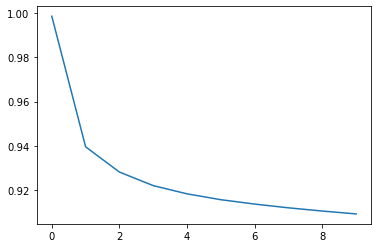

In [3]:
training_loss = np.genfromtxt('./train_loss.csv', delimiter=',')
training_loss = training_loss[1:,1:]
pyp.plot(training_loss[:,0])

print("Loss Minima at Epoch : ",np.argmin(training_loss[:,0]))

In [4]:
def audio_from_mdct(mdct_norm,band_E, band_defs):
    band_E = 2**(band_E + ebandMeans[:21])
    mdct_recon = mdctbands2mdct(mdct_norm,band_E,band_defs)
    recon_x = imdct_ola(mdct_recon,960*2,480*2,mdct_recon.shape[0]*960)
    recon_x = lfilter([1],[1,-0.85],recon_x)
    
    return recon_x

In [6]:
# model_shape = plc_network.plc_shape_cnn(batch_size=1)
# band_defs = np.array([0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 12, 14])*8
# model_shape = plc_network.plc_shape(nb_cepstral_features = int(band_defs[-1] - band_defs[0]),cond_size = 1000,batch_size=1,band_defs = band_defs)
# model_shape = plc_network.plc_shape_cnn(nb_cepstral_features = int(band_defs[-1] - band_defs[0]), batch_size=1, band_defs = band_defs)
# band_defs = np.array([0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 12, 14, 16, 20, 24, 28, 34, 40, 48, 60, 78, 100])*8
band_defs = np.array([0,  1])*8
band_defs_recon = np.array([0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 12, 14, 16, 20, 24, 28, 34, 40, 48, 60, 78, 100])*8
model_shape_init = plc_network.plc_shape_cnnfull(nb_cepstral_features = int(band_defs[-1] - band_defs[0]), batch_size=1, band_defs = band_defs)
model_shape_init.load_weights('./model_weights/plcshape_cnnfull_withoutaug_lowbandonly_256_128_initial.h5')

model_shape_trained = plc_network.plc_shape_cnnfull(nb_cepstral_features = int(band_defs[-1] - band_defs[0]), batch_size=1, band_defs = band_defs)
model_shape_trained.load_weights('./model_weights/plcshape_cnnfull_withoutaug_lowbandonly_256_128_10.h5')

In [7]:
# Loading CELT MDCTs
ee_celt = np.fromfile("../../datasets/spe_test_48kfull_bandLogE",dtype='float32')
mm_celt = np.fromfile("../../datasets/spe_test_48kfull_mdctnormalized",dtype='float32')

sequence_size_shape = 100
nb_features_cepstral = 960
nb_features = 21
nb_sequences_shape = len(mm_celt)//(nb_features_cepstral*sequence_size_shape)
nb_sequences_E = len(ee_celt)//(nb_features*sequence_size_shape)

mm_celt = mm_celt[:nb_sequences_shape*sequence_size_shape*nb_features_cepstral]
mm_celt = np.reshape(mm_celt, (nb_sequences_shape, sequence_size_shape, nb_features_cepstral))
mm_celt = mm_celt[:(int)(1*nb_sequences_shape), :, :800]
mm_celt = np.concatenate((mm_celt.squeeze(),np.zeros((mm_celt.shape[0],mm_celt.shape[1],160))),axis = -1)
mm_celt = mm_celt.squeeze()

ee_celt = ee_celt[:nb_sequences_E*sequence_size_shape*nb_features]
ee_celt = np.reshape(ee_celt, (nb_sequences_E, sequence_size_shape, nb_features))
ee_celt = ee_celt[:(int)(1*nb_sequences_E), :, :]
ee_celt = ee_celt.squeeze()

In [24]:
triarr = np.expand_dims(np.arange(8),-1)
triarr = (triarr/np.linalg.norm(triarr))
zxf = np.expand_dims(np.stack([triarr for i in range(1,101)]),0).transpose([0,2,1,3])
# zxf = plc_network.renormalizer(band_defs,'in')(zxf)
zxf_out = model_shape_init(zxf).numpy()

ValueError: Input 0 of layer "model_4" is incompatible with the layer: expected shape=(None, 800, 100, 1), found shape=(1, 8, 100, 1)

In [8]:
from plc_loader import *
loader = PLCLoader_shape(mm_celt,ee_celt,100,1,1)

z = []
for l in loader:
    z.append(l)

In [33]:
import tensorflow as tf

In [46]:
N = 960*2
I = np.eye(N//4)
J = np.fliplr(I)
Z = np.zeros((N//4,N//4))
Q = np.concatenate((np.concatenate((Z,Z,-J,-I),1),np.concatenate((I,-J,Z,Z),1)),0)

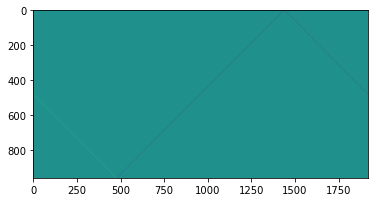

In [47]:
pyp.imshow(Q)

In [34]:
I = tf.eye(N//4)

In [43]:
N = 960*2
I = tf.eye(N//4)
J = tf.reverse(I,[-1])
Z = tf.zeros((N//4,N//4))
Q = tf.concat((tf.concat((Z,Z,-J,-I),1),tf.concat((I,-J,Z,Z),1)),0)

In [50]:
x_tilde = tf.zeros(100)

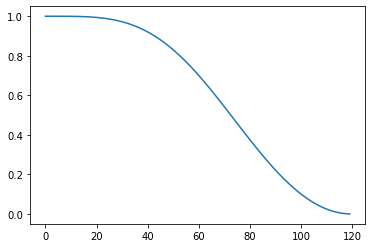

In [105]:
pyp.plot(tf.reverse(vw,[-1]).numpy())

In [183]:
def tf_imdct_frame(x):
    x = tf.squeeze(x)
    N = 960*2
    I = tf.eye(N//4)
    J = tf.reverse(I,[-1])
    Z = tf.zeros((N//4,N//4))
    Q = tf.concat((tf.concat((Z,Z,-J,-I),1),tf.concat((I,-J,Z,Z),1)),0)
    Qt = tf.cast(tf.transpose(Q,[1,0]),'float64')
    
    # 120 Sample Vorbis Window
    Nw = 120
    vw = tf.sin((np.pi/2)*(tf.sin((np.pi/(2*Nw))*(tf.range(Nw,dtype = 'float') + 0.5)))**2)
    w = tf.concat((tf.zeros(420),vw,tf.ones(840),tf.reverse(vw,[-1]),tf.zeros(420)),-1)
    w = tf.cast(w,'float64')
    imdct = tf.matmul(Qt,tf.expand_dims(tf.signal.idct(x, type = 4, norm = None),-1))*0.5
    imdct = tf.squeeze(imdct)*w
    return imdct

def tf_mdctbands2mdct(mdct_bands,list_E,band_defs):
    """
    Given energies and normalized MDCT return the original un-normalized MDCT coefficients
    (zero out coefficients 800:960 in accordance with CELT)
    """
    
    l = []
    for i in range(band_defs.shape[0] - 1):
        E = list_E[:,i][:,None]
        l.append(E*mdct_bands[:,band_defs[i] - band_defs[0]:band_defs[i+1] - band_defs[0]])
    M = tf.concat(l,1)
    M = tf.concat((M,tf.zeros((M.shape[0],960 - M.shape[1]),dtype = M.dtype)),-1)

    return M

def tf_imdct_ola(x,list_E,N,H,Nog,band_defs,ebandMeans):
    """
    Overlap-add reconstruction from short-time windowed MDCT
    """
    x = x.squeeze()
    x = tf.transpose(x,[1,0])
    
    band_E = 2**(list_E.squeeze() + ebandMeans[:21])
    # Un-normalize mdct with available energies
    x = tf_mdctbands2mdct(x,band_E,band_defs)
    
    l = []
    for i in range(x.shape[0]):
        l.append(tf_imdct_frame(x[i,:]))
    
    return l

In [184]:
l = tf_imdct_ola(z[1][0],z[1][1].squeeze(),960*2,480*2,960*100,band_defs_recon,ebandMeans)

In [185]:
M = tf.expand_dims(tf.stack(l,0),0)
Mola = tf.signal.overlap_and_add(M,960)

In [186]:
IPython.display.display(IPython.display.Audio(data = Mola.numpy().squeeze(),rate = 48000))

In [43]:
zarr = (np.arange(960)%2).astype('float')
zarr = np.stack([zarr for i in range(100)])
zarr = zarr.transpose([1,0])
zarr = np.stack([zarr for i in range(16)],0)
zarr = np.expand_dims(zarr,-1)
# zarr = np.stack([zarr for i in range(16)],0)

# zstack = np.concatenate([t[0],zarr],-1)

In [171]:
t = z[0]

# Common energy for all reconstructions
# energy_og = t[1].squeeze()
energy_recon = np.roll(t[1].squeeze(),-2,0)
mdct_og = t[2].squeeze().T
x_og = audio_from_mdct(mdct_og,energy_recon,band_defs_recon)

net_pred_shape_rand = model_shape_init(t[0][:,band_defs[0]:band_defs[-1],:,:]).numpy()
net_pred_shape_rand = np.concatenate((net_pred_shape_rand,t[0].squeeze()[band_defs[-1]:,:]),axis = 0).T
recon_x_shapepred_rand = audio_from_mdct(net_pred_shape_rand,energy_recon,band_defs_recon)

net_pred_shape_trained = model_shape_trained(t[0][:,band_defs[0]:band_defs[-1],:,:]).numpy()
net_pred_shape_trained = np.concatenate((net_pred_shape_trained,t[0].squeeze()[band_defs[-1]:,:]),axis = 0).T
recon_x_shapepred_trained = audio_from_mdct(net_pred_shape_trained,energy_recon,band_defs_recon)

shape_recon_previous = np.roll(t[0][:,band_defs[0]:band_defs[-1],:,:].squeeze(),-1,-1)
shape_recon_previous = np.concatenate((shape_recon_previous,t[0].squeeze()[band_defs[-1]:,:]),axis = 0).T
recon_x_shapepred_previous = audio_from_mdct(shape_recon_previous,energy_recon,band_defs_recon)

In [172]:
IPython.display.display(IPython.display.Audio(data = x_og,rate = 48000))
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred_rand,rate = 48000))
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred_previous,rate = 48000))
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred_trained,rate = 48000))

In [16]:
print("RAND : ", np.linalg.norm(x_og - recon_x_shapepred_rand))
print("PREVIOUS : ", np.linalg.norm(x_og - recon_x_shapepred_previous))
print("TRAINED : ", np.linalg.norm(x_og - recon_x_shapepred_trained))

RAND :  1103706.850226012
PREVIOUS :  1115315.1455045086
TRAINED :  1019213.7591099843


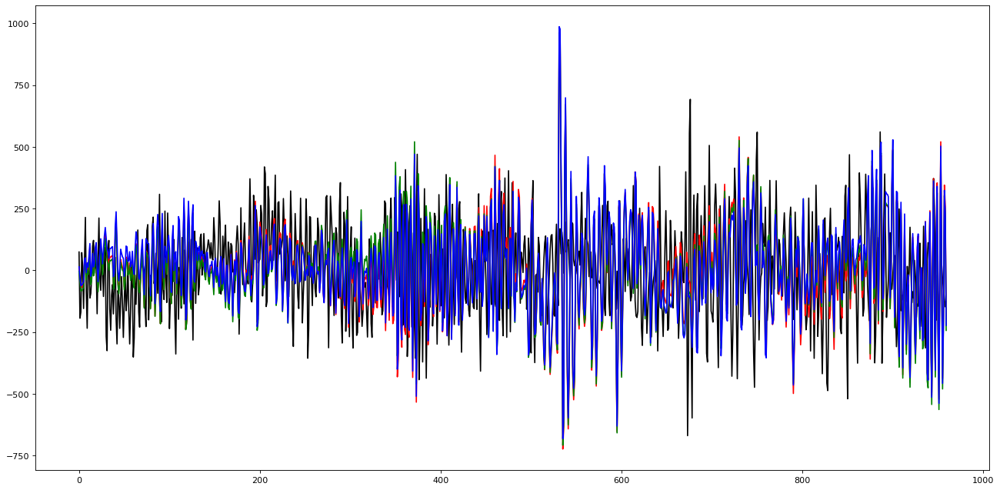

In [17]:
pyp.figure(figsize=(20, 10), dpi=80)
pyp.plot(x_og[960*5:960*6],'k')
pyp.plot(recon_x_shapepred_trained[960*5:960*6],'r')
pyp.plot(recon_x_shapepred_rand[960*5:960*6],'g')
pyp.plot(recon_x_shapepred_previous[960*5:960*6],'b')

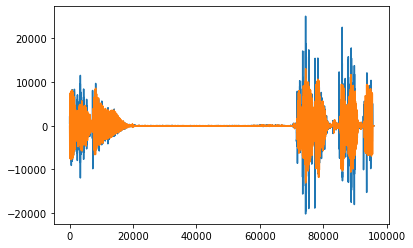

In [24]:
pyp.plot(recon_x_shapepred_trained)
pyp.plot(x_og)

In [16]:
net_pred_shape_rand = model_shape_init(z[1][0][:,band_defs[0]:band_defs[-1],:,:]).numpy()
net_pred_shape_rand = np.concatenate((net_pred_shape_rand,z[1][0].squeeze()[band_defs[-1]:,:]),axis = 0)
net_pred_shape_rand.shape

(960, 100)

In [21]:
np.linalg.norm(z[1][0].squeeze()[:8,0])

1.0000000138516774

In [9]:
z[1][0].shape

(1, 960, 100, 1)

In [25]:
# net_pred_shape_rand = model_shape_init(z[1][0][:,band_defs[0]:band_defs[-1],:,:]).numpy()
# net_pred_shape_trained = model_shape_trained(z[1][0][:,band_defs[0]:band_defs[-1],:,:]).numpy()
# shape_recon_previous = np.roll(z[1][0][:,band_defs[0]:band_defs[-1],:,:].squeeze(),-1,-1)
# net_pred_shape_rand = np.concatenate((net_pred_shape_rand,z[1][0].squeeze()[band_defs[-1]:,:]),axis = 0)
# net_pred_shape_trained = np.concatenate((net_pred_shape_trained,z[1][0].squeeze()[band_defs[-1]:,:]),axis = 0)
# shape_recon_previous = np.concatenate((shape_recon_previous,z[1][0].squeeze()[band_defs[-1]:,:]),axis = 0)
mdct_recon_shapepred_og = z[1][0].squeeze()
# net_pred_shape_rand = np.concatenate((net_pred_shape_rand,np.zeros((960 - band_defs[-1],net_pred_shape_rand.shape[1]))),axis = 0)
# net_pred_shape_trained = np.concatenate((net_pred_shape_trained,np.zeros((960 - band_defs[-1],net_pred_shape_trained.shape[1]))),axis = 0)
# shape_recon_previous = np.concatenate((shape_recon_previous,np.zeros((960 - band_defs[-1],shape_recon_previous.shape[1]))),axis = 0)
# mdct_recon_shapepred_og = np.concatenate((z[1][0].squeeze(),np.zeros((160,z[1][0].squeeze().shape[1]))),axis = 0)
# shape_recon_rand = net_pred_shape_rand.T
# shape_recon_trained = net_pred_shape_trained.T 
# shape_recon_previous = shape_recon_previous.T
mdct_recon_shapepred_og = mdct_recon_shapepred_og.T

energy_recon = z[1][1].squeeze()

In [26]:
band_E_shapepred = 2**(energy_recon + ebandMeans[:21])
mdct_recon_shapepred_og = mdctbands2mdct(mdct_recon_shapepred_og,band_E_shapepred,band_defs)
mdct_recon_shapepred_rand = mdctbands2mdct(shape_recon_rand,band_E_shapepred,band_defs)
mdct_recon_shapepred_trained = mdctbands2mdct(shape_recon_trained,band_E_shapepred,band_defs)
mdct_recon_shapepred_previous = mdctbands2mdct(shape_recon_previous,band_E_shapepred,band_defs)

recon_x_shapepred_rand = imdct_ola(mdct_recon_shapepred_rand,960*2,480*2,mdct_recon_shapepred_rand.shape[0]*960)
recon_x_shapepred_rand = lfilter([1],[1,-0.85],recon_x_shapepred_rand)

recon_x_shapepred_trained = imdct_ola(mdct_recon_shapepred_trained,960*2,480*2,mdct_recon_shapepred_trained.shape[0]*960)
recon_x_shapepred_trained = lfilter([1],[1,-0.85],recon_x_shapepred_trained)

recon_x_shapepred_previous = imdct_ola(mdct_recon_shapepred_previous,960*2,480*2,mdct_recon_shapepred_previous.shape[0]*960)
recon_x_shapepred_previous = lfilter([1],[1,-0.85],recon_x_shapepred_previous)

recon_x_shapepred_og = imdct_ola(mdct_recon_shapepred_og,960*2,480*2,mdct_recon_shapepred_og.shape[0]*960)
recon_x_shapepred_og = lfilter([1],[1,-0.85],recon_x_shapepred_og)

In [27]:
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred_og,rate = 48000))
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred_rand,rate = 48000))
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred_previous,rate = 48000))
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred_trained,rate = 48000))

In [30]:
print("RAND : ", np.linalg.norm(recon_x_shapepred_og - recon_x_shapepred_rand))
print("PREVIOUS : ", np.linalg.norm(recon_x_shapepred_og - recon_x_shapepred_previous))
print("TRAINED : ", np.linalg.norm(recon_x_shapepred_og - recon_x_shapepred_trained))

RAND :  1353186.0159854994
PREVIOUS :  1153602.144524453
TRAINED :  1123530.4287252552


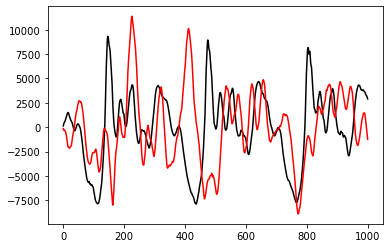

In [32]:
pyp.plot(recon_x_shapepred_og[:1000],'k')
pyp.plot(recon_x_shapepred_trained[:1000],'r')

In [6]:
fT = mm_celt[:,:,band_defs[0]:band_defs[-1]].squeeze()
fTi = np.transpose(fT,[0,2,1])
outp = model_shape(np.expand_dims(fTi,-1)).numpy()
outp = np.transpose(outp,[0,2,1])
targ = np.roll(fT.squeeze(),-2,-2)


In [7]:
print(targ.shape,outp.shape)

(18, 100, 800) (18, 100, 800)


In [8]:
outp[0,10,:].shape

(800,)

In [10]:
np.linalg.norm(outp[0,12,:][624:800])

0.99999994

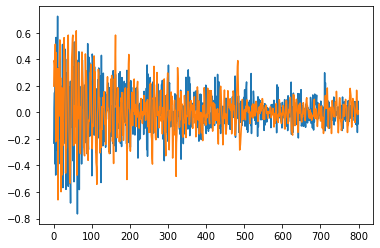

In [11]:
pyp.plot(outp[0,12,:])
pyp.plot(targ[0,12,:])

In [12]:
e = (targ[0,12,:] - outp[0,12,:])

In [13]:
rV = np.random.randn(band_defs[i+1] - band_defs[i])

NameError: name 'i' is not defined

In [14]:
s = 0
for i in range(band_defs.shape[0] - 1):
    e = (targ[0,7,band_defs[i]:band_defs[i+1]] - outp[0,7,band_defs[i]:band_defs[i+1]])
    # rV1 = np.random.randn(band_defs[i+1] - band_defs[i])
    # rV2 = np.random.randn(band_defs[i+1] - band_defs[i])
    # e = rV1/np.linalg.norm(rV1) - rV2/np.linalg.norm(rV2)
    # e = (targ[0,10,band_defs[i]:band_defs[i+1]] - rV1/np.linalg.norm(rV1))
    s+= np.sqrt(np.sum(np.square(e)))

In [15]:
s

26.24641328958588

In [16]:
outp[0][:,20].shape

(100,)

In [17]:
targ[0][20].shape

(800,)

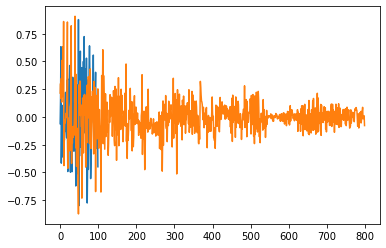

In [18]:
pyp.plot(outp[0][:,20])
pyp.plot(targ[0][20])

In [44]:
rms_loss = 0
for i in range(band_defs.shape[0] - 1):
    e = outp - targ
    rms_loss+= np.sqrt(np.sum(np.square(e[0,10,band_defs[i] - band_defs[0]:band_defs[i+1] - band_defs[0]])))

In [46]:
rms_loss

37.242927209264785

In [7]:
# The main reconstruction: network takes input as previous 2 frames and spits next frame
# band_defs = np.array([0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 12, 14])*8
fT = mm_celt[:,:,band_defs[0]:band_defs[-1]].squeeze()
shape_recon = []
energy_recon = []

inds = np.arange(2,fT.shape[0],3)
# for i in range(0,fT.shape[0]):
    # if (inds == i).any():
    # print(fT[i,:,:].reshape(1,fT.shape[-1],sequence_size_shape,1).shape)
ip_net = np.expand_dims(np.transpose(fT,[0,2,1]),-1)
op_net = model_shape(ip_net).numpy()
op_net = np.transpose(op_net,[0,2,1])
shape_recon = np.concatenate((op_net,np.zeros((op_net.shape[0],sequence_size_shape,160))),axis = -1)
energy_recon = ee_celt
# shape_recon.append(model_shape(ip_net).numpy()) #CNN
    # shape_recon.append(fT[i,:,:].T)
        # shape_recon.append(model_shape(fT[i-2:i,:].reshape(1,2*fT.shape[-1])).numpy()) #Feedforward
        # Previous frame
        # shape_recon.append(fT[i,:].reshape(-1,fT.shape[-1]))
    # else:
        # shape_recon.append(fT[i,:].reshape(-1,fT.shape[-1]))
# energy_recon.append(ee_celt[i,:].squeeze())
    
# shape_recon = np.stack(shape_recon,axis = 0).squeeze()
# shape_recon = np.concatenate(shape_recon,1).T
# shape_recon = shape_recon.reshape(-1,800)
# shape_recon = np.concatenate((shape_recon,np.zeros((shape_recon.shape[0],160))),axis = -1)
# # shape_recon = np.concatenate((shape_recon,mm_celt[2:,band_defs[-1]:]),axis = -1) #Predict Low Frequency, fill high frequency
# # # shape_recon = np.concatenate((mm_celt[2:,:band_defs[0]]*0,shape_recon,np.zeros((shape_recon.shape[0],160))),axis = -1) #Predict High Frequency, fill low frequency
# energy_recon = np.stack(energy_recon,axis = 0)
# energy_recon = energy_recon.reshape(-1,21)

# energy_recon = np.concatenate(energy_recon)

In [8]:
shape_recon = shape_recon.reshape(-1,960)
energy_recon = energy_recon.reshape(-1,21)

In [22]:
ee_celt.shape

(18, 100, 21)

In [29]:
# Simulate Packet Dropping
inds = np.arange(0,shape_recon.shape[0],3)
for i in range(shape_recon.shape[0]):
    if (inds == i).any():
        continue
    else:
        shape_recon[i,:800] = fT.reshape(-1,800)[i]

In [ ]:
model_shape(fT[i,:,:].reshape(1,fT.shape[-1],sequence_size_shape,1)).numpy().shape

In [ ]:
shape_recon.shape

In [ ]:
np.concatenate(energy_recon).shape

In [ ]:
np.linalg.norm(shape_recon[1,8:16,1])

In [ ]:
np.linalg.norm(mm_celt.reshape(-1,800)[0][16:24])

In [ ]:
np.linalg.norm(shape_recon.reshape((1850,800))[0][:8])

In [ ]:
np.linalg.norm(shape_recon[0][:,0][8:16])

In [ ]:
np.linalg.norm(shape_recon[0,32:40,0])

In [ ]:
np.linalg.norm(shape_recon[0][:8])

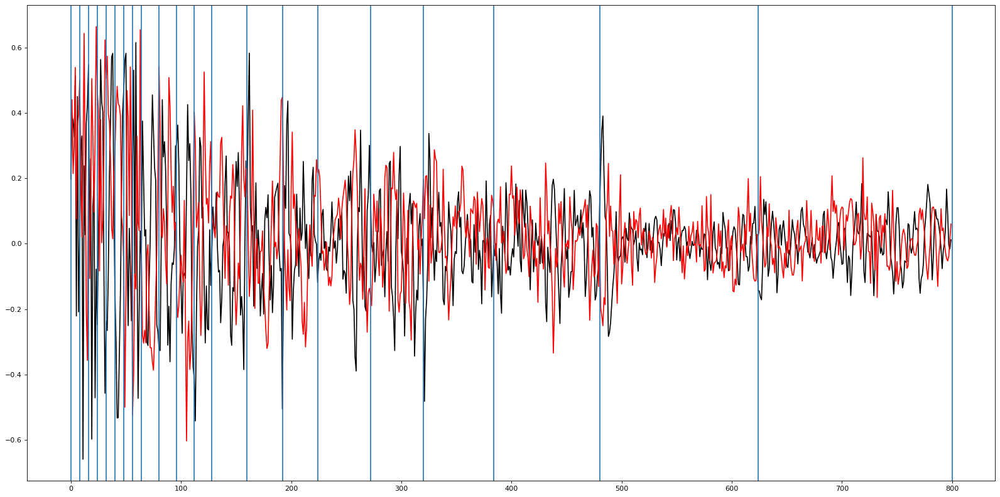

In [12]:
nplots = 1
pyp.figure(figsize=(20, 10), dpi=80)
for i in range(nplots):
    randind = np.random.randint(inds.shape[0])
    randind = inds[randind]
    pyp.subplot(nplots,1,i+1)
    pyp.plot(fT.reshape(-1,800)[randind].squeeze(),'k')
    pyp.plot(shape_recon[randind][band_defs[0]:band_defs[-1]],'r')
    for j in band_defs:
        pyp.axvline(j)
pyp.tight_layout()

In [ ]:
np.linalg.norm(shape_recon.reshape(-1,800)[0][16:24])

In [ ]:
for j in range(band_defs.shape[0] - 1):
    print(np.linalg.norm(shape_recon[randind][band_defs[j]:band_defs[j+1]]))

In [31]:
# Reconstructing with next frame shape
# Uncomment below line if log
band_defs = np.array([0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 12, 14, 16, 20, 24, 28, 34, 40, 48, 60, 78, 100])*8
band_E_shapepred = 2**(energy_recon + ebandMeans[:21])
mdct_recon_shapepred = mdctbands2mdct(shape_recon,band_E_shapepred,band_defs)
recon_x_shapepred = imdct_ola(mdct_recon_shapepred,960*2,480*2,mdct_recon_shapepred.shape[0]*960)
recon_x_shapepred = lfilter([1],[1,-0.85],recon_x_shapepred)

band_E_og = 2**(ee_celt.reshape(-1,21) + ebandMeans[:21])
mdct_recon_og = mdctbands2mdct(mm_celt.reshape(-1,960),band_E_og,band_defs)
recon_x_og = imdct_ola(mdct_recon_og,960*2,480*2,mdct_recon_og.shape[0]*960)
recon_x_og = lfilter([1],[1,-0.85],recon_x_og)

In [32]:
print("Network Prediction")
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred,rate = 48000))
print("Original")
IPython.display.display(IPython.display.Audio("/home/ubuntu/datasets/spe48.wav"))

Network Prediction


Original


In [ ]:
band_defs = np.array([0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 12, 14, 16, 20, 24, 28, 34, 40, 48, 60, 78, 100])*8
for i in range(band_defs.shape[0] - 1):
    band_E_shapepred = 2**(energy_recon + ebandMeans[:21])
    sR = np.zeros_like(shape_recon)
    sR[:,:] = mm_celt[2:,:]
    sR[:,band_defs[i]:band_defs[i+1]] = shape_recon[:,band_defs[i]:band_defs[i+1]]
    mdct_recon_shapepred = mdctbands2mdct(sR,band_E_shapepred,band_defs)
    recon_x_shapepred = imdct_ola(mdct_recon_shapepred,960*2,480*2,mdct_recon_shapepred.shape[0]*960)
    recon_x_shapepred = lfilter([1],[1,-0.85],recon_x_shapepred)
    
    print(band_defs[i])
    IPython.display.display(IPython.display.Audio(data = recon_x_shapepred,rate = 48000))

In [ ]:
# Save waveforms
wavfile.write('./audio/network_prediction_77epochs.wav',48000,(recon_x_shapepred/32768).astype('float32'))

In [ ]:
IPython.display.display(IPython.display.Audio("./audio/previous_prediction.wav"))

In [ ]:
# Plotting actual frames vs predicted frames
# og_audio = np.fromfile("../../datasets/spe48.sw",dtype='short')*1.0
# c = (6.3*3/48000)
# og_audio = og_audio[960*2 + 420:]
# og_audio = lfilter([1,-1],[1,-(1-c)],og_audio) # DC Reject
# recon_x_shapepred = recon_x_shapepred[:og_audio.shape[0]]

recon_x_og = recon_x_og[960*2:]

In [ ]:
shape_recon.shape

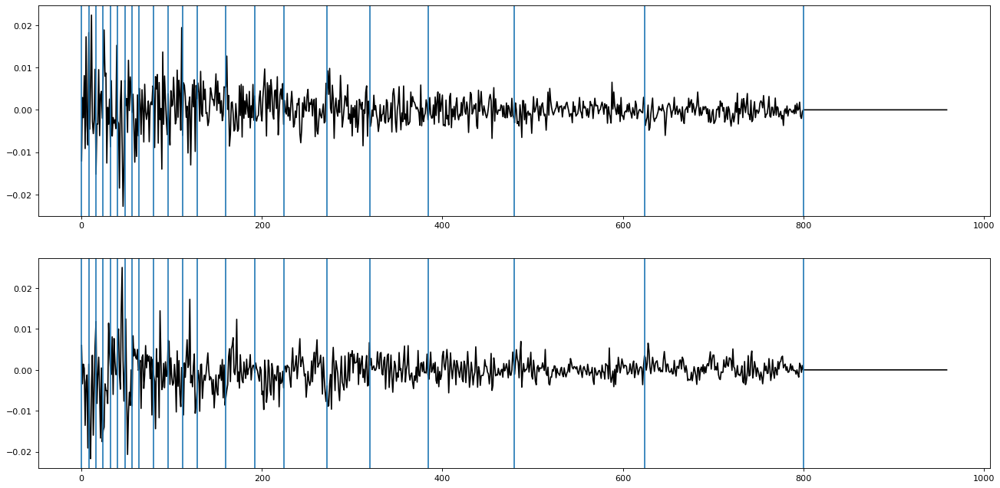

In [11]:
pyp.figure(figsize=(20, 10), dpi=80)
pyp.subplot(211)
pyp.plot(mm_celt.reshape(-1,960).mean(0),'k')
for j in band_defs:
    pyp.axvline(j)
pyp.subplot(212)
pyp.plot(shape_recon.mean(0),'k')
for j in band_defs:
    pyp.axvline(j)

In [ ]:
bw = np.flip(np.arange(1,band_defs.shape[0] - 1))
bw = bw/bw.sum()

In [ ]:
for j in range(band_defs.shape[0] - 1):
    print(np.linalg.norm(shape_recon.mean(0)[band_defs[j]:band_defs[j+1]]))

In [ ]:
recon_x_og.shape[0]/960

In [ ]:
inds[:5]*960

In [ ]:
2400 - 960

In [ ]:
Nw = 120
vw = np.sin((np.pi/2)*(np.sin((np.pi/(2*Nw))*(np.arange(Nw) + 0.5)))**2)
w = np.concatenate((np.zeros(420),vw,np.ones(840),np.flip(vw),np.zeros(420)))

In [ ]:
packets_lost = np.ones_like(recon_x_og)
for i in range(recon_x_og.shape[0]):
    if (i == inds).any():
        # print(i*120,i*120 + 960)
        packets_lost[i*960:i*960 + 1920] = 0
    else:
        continue

In [ ]:
pyp.plot(packets_lost[:5000]*5000)
pyp.plot(recon_x_shapepred[:5000])
pyp.plot(w*5000)
pyp.plot(recon_x_og[:5000])

In [ ]:
randind = np.random.randint(inds.shape[0])
randind = inds[randind]

pyp.plot(recon_x_og[:5000])
pyp.plot(recon_x_shapepred[:5000])
# pyp.plot(recon_x_shapepred[120*randind:120*randind + 960])

# pyp.plot(og_audio[120*randind:120*randind + 960] - recon_x_shapepred[120*randind:120*randind + 960])
# pyp.plot(recon_x_shapepred[120*randind:120*randind + 960])
# pyp.plot(recon_x_shapepred[:5000])
# pyp.plot(recon_x_shapepred[120*randind:120*randind + 960])
# pyp.plot(recon_x_shapepred[240:240 + 960])
# pyp.plot(w)

In [ ]:
inds

In [ ]:
mm_celt

In [ ]:
gru_size = 256
cond_size = 128
nb_features = 21
sequence_size = 100

# MDCT Parameters
N = 960*2
H = 480*2
# Load log-Energies and unnormalized coefficients
log_tD = np.fromfile("../../datasets/spe_test_48kfull_bandLogE",dtype='float32')
mdct_normalized = np.fromfile("../../datasets/spe_test_48kfull_mdctnormalized",dtype='float32')

nb_sequences = len(log_tD)//(nb_features*sequence_size)
features = log_tD[:nb_sequences*sequence_size*nb_features]
features = np.reshape(features, (nb_sequences, sequence_size, nb_features))

mdct_normalized = mdct_normalized[:nb_sequences*sequence_size*960]
mdct_normalized = np.reshape(mdct_normalized,(mdct_normalized.shape[0]//960,960))
mdct_normalized[:,800:] = 0

# lost = np.random.randint(2, size=(nb_sequences,sequence_size,1))
model = plc_network.new_lpcnet_plc_model(rnn_units=gru_size, batch_size=features.shape[0], training=False, cond_size=cond_size)

model.load_weights('./model_weights/tts_48kfull_seq100_256_95.h5')

In [ ]:
lost = np.random.choice([0, 1], size=(nb_sequences,sequence_size,1), p=[0.4, 0.6])

In [ ]:
lost_mask = np.tile(lost, (1,1,features.shape[2]))
in_features = features*lost_mask

In [ ]:
log_tD_netout = model([in_features,lost]).numpy()
log_tD_netout = np.reshape(log_tD_netout,(-1,nb_features))

In [ ]:
lost[0]

In [ ]:
pyp.plot(log_tD_netout[-3],'r')
pyp.plot(features.reshape(-1,21)[-3],'k')

In [ ]:
# Original Audio
band_E_og = 2**(features.reshape(-1,21) + ebandMeans[:21])
mdct_recon_og = mdctbands2mdct(mdct_normalized,band_E_og,band_defs)
recon_x_og = imdct_ola(mdct_recon_og,N,H,log_tD_netout.shape[0]*N//2)
recon_x_og = lfilter([1],[1,-0.85],recon_x_og)

In [ ]:
IPython.display.display(IPython.display.Audio(data = recon_x_og,rate = 48000))

In [ ]:
# Network compensated PLC
band_E_recon = 2**(log_tD_netout + ebandMeans[:21])
mdct_plcnet_x = mdctbands2mdct_with_neuralplc(mdct_normalized,band_E_og,band_E_recon,band_defs,lost.reshape(-1),choice = 0)
recon_x_plcnet = imdct_ola(mdct_plcnet_x,N,H,log_tD_netout.shape[0]*N//2)
recon_x_plcnet = lfilter([1],[1,-0.85],recon_x_plcnet)

In [ ]:
IPython.display.display(IPython.display.Audio(data = recon_x_plcnet,rate = 48000))

In [ ]:
# Dumb PLC
mdct_dumbplc_x = mdctbands2mdct_withplc(mdct_normalized,band_E_og,band_defs,lost.reshape(-1),choice = 2)
recon_x_dumbbplc = imdct_ola(mdct_dumbplc_x,N,H,log_tD_netout.shape[0]*N//2)
recon_x_dumbbplc = lfilter([1],[1,-0.85],recon_x_dumbbplc)

In [ ]:
band_E_og.shape

In [ ]:
np.count_nonzero(np.delete((lost.reshape(-1) == 0),0))

In [ ]:
IPython.display.display(IPython.display.Audio(data = recon_x_dumbbplc,rate = 48000))

In [ ]:
pyp.plot(recon_x_og)

### Playing around

In [ ]:
# Normal Reconstruction/Playing around with the entire audio
band_E_recon = 2**(log_tD_netout + ebandMeans[:21])
mdct_recon_x_randE = mdctbands2mdct(mdct_normalized,np.random.randn(*band_E_recon.shape)**2,band_defs)
recon_x_randE = imdct_ola(mdct_recon_x_randE,N,H,log_tD_netout.shape[0]*N//2)

mdct_normalized_random = np.copy(mdct_normalized)
for i in range(band_defs.shape[0] - 1):
    rV = np.random.randn(mdct_normalized_random.shape[0],band_defs[i+1] - band_defs[i])
    rV = rV/np.linalg.norm(rV,axis = 0)
    mdct_normalized_random[:,band_defs[i]:band_defs[i+1]] = rV*band_E_recon[:,i][:,None]
recon_x_randmdct = imdct_ola(mdct_normalized_random,N,H,log_tD_netout.shape[0]*N//2)

In [ ]:
IPython.display.display(IPython.display.Audio(data = recon_x_randE,rate = 48000))
IPython.display.display(IPython.display.Audio(data = recon_x_randmdct,rate = 48000))

In [ ]:
band_E_recon = 2**(log_tD_netout + ebandMeans[:21])
mdct_plcnet_x = mdctbands2mdct_withplc(mdct_normalized,band_E_recon,band_defs,lost.reshape(-1))
recon_x_plcnet = imdct_ola(mdct_plc_x,N,H,log_tD_netout.shape[0]*N//2)

In [ ]:
IPython.display.display(IPython.display.Audio(data = recon_x,rate = 48000))

In [ ]:
pyp.plot(recon_x)

In [ ]:
np.where(lost.reshape(-1)[:20] == 0)

In [ ]:
inds = np.where(lost.reshape(-1)==0)[0]

In [ ]:
39018//21//2

In [ ]:
# Load log-Energies and unnormalized coefficients
features_E = np.fromfile("../../datasets/spe_test_48kfull_bandLogE",dtype='float32')
# fE_recon = features_E
# fE_recon = fE_recon[:(len(fE_recon)//(nb_features))*21]
# fE_recon = np.reshape(fE_recon, ((len(fE_recon)//(21))*21, 1, 21))
features_mdct = np.fromfile("../../datasets/spe_test_48kfull_mdctnormalized",dtype='float32')

sequence_size_shape = 1
nb_features_cepstral = 960
nb_features = 21
nb_sequences_shape = len(features_mdct)//(nb_features_cepstral*sequence_size_shape)
features_mdct = features_mdct[:nb_sequences_shape*sequence_size_shape*nb_features_cepstral]
features_mdct = np.reshape(features_mdct, (nb_sequences_shape, sequence_size_shape, nb_features_cepstral))
features_mdct = features_mdct[:(int)(1*nb_sequences_shape), :, :800]

nb_sequences_E = len(features_E)//(nb_features*sequence_size_shape)
features_E = features_E[:nb_sequences_E*sequence_size_shape*nb_features]
features_E = np.reshape(features_E, (nb_sequences_E, sequence_size_shape, nb_features))
features_E = features_E[:(int)(1*nb_sequences_E), :, :]

# fT = np.concatenate((features_mdct,features_E),axis = -1)
fT = features_mdct[:,:,:8]

In [ ]:
features_E.shape

In [ ]:
frames = frames.reshape((-1,1080))

In [ ]:
Nw = 120
vw = np.sin((np.pi/2)*(np.sin((np.pi/(2*Nw))*(np.arange(Nw) + 0.5)))**2)
w = np.concatenate((np.zeros(420),vw,np.ones(840),np.flip(vw),np.zeros(420)))

In [ ]:
pyp.plot(audio_from_opus[:5000] - emph_audio[:5000]*32768)
# pyp.plot(emph_audio[:5000]*32768)

In [ ]:
ind = 32
pyp.plot(frames[ind][:-120],'r.')
pyp.plot(frames[ind])
# pyp.plot(frames[ind + 1][:120])
# pyp.plot((zpog[960*ind:960*ind + 1920]*32768)[420:-420])
# pyp.plot(frames[ind] - (zpog[960*ind:960*ind + 1920]*32768)[420:-420])

In [ ]:
original_audio = np.fromfile("../../datasets/spe48.sw",dtype='short').astype('float32')
emph_audio = sosfilt(tf2sos([1,-0.85],[1]),original_audio)

In [ ]:
frames = np.fromfile("/home/ubuntu/opus/mdct_inp",dtype='float32')
frames = frames.reshape((-1,1080))
audio_from_opus = np.zeros_like(original_audio)
for i in range(frames.shape[0] - 1):
    audio_from_opus[960*i:960*(i + 1)] = frames[i][:-120]

audio_from_opus = audio_from_opus[120:]
emph_audio = audio_from_opus

audio_from_opus_deemph = sosfilt(tf2sos([1],[1,-0.85]),audio_from_opus) 

In [ ]:
pyp.plot(audio_from_opus_deemph[:1000000] - original_audio[:1000000])
# pyp.plot(original_audio[:1000000])

In [ ]:
zpog = np.concatenate((np.zeros(540),emph_audio))
# ee,mm = mdct2bands(mdct_frame(zpog[960*ind:960*(ind + 2)])[None,:],band_defs)
ee,mm = mdct2bands(mdct_ola(zpog,960*2,480*2),band_defs)
mm[:,800:] = 0

In [ ]:
ee.shape

In [ ]:
ind = 1000
pyp.plot(mm.squeeze()[ind][:800] - features_mdct.squeeze()[ind][:800])
# pyp.plot(features_mdct.squeeze()[ind][:800])

In [ ]:
# np.linalg.norm(mm[:,:800] - features_mdct.squeeze()[:1856,:])
np.linalg.norm(ee - features_E.squeeze()[:1856,:])

In [ ]:
pyp.plot(ee.squeeze()[ind] - features_E.squeeze()[ind])
# pyp.plot(features_E.squeeze()[ind])

In [ ]:
mdct_test_opus =  mdctbands2mdct(np.concatenate((features_mdct.squeeze(),np.zeros((features_mdct.shape[0],160))),axis = -1),features_E.squeeze(),band_defs)
# mdct_test_opus =  mdctbands2mdct(np.concatenate((features_mdct[:1856,:].squeeze(),mm[:,800:]),axis = -1),features_E[:1856,:].squeeze(),band_defs)
recon_test_opus = imdct_ola(mdct_test_opus,960*2,480*2,mdct_test_opus.shape[0]*960)
recon_test_opus = sosfilt(tf2sos([1],[1,-0.85]),recon_test_opus)

In [ ]:
mdct_test_own =  mdctbands2mdct(np.concatenate((mm.squeeze(),np.zeros((mm.shape[0],0))),axis = -1),ee.squeeze(),band_defs)
recon_test_own = imdct_ola(mdct_test_own,960*2,480*2,mdct_test_own.shape[0]*960)
recon_test_own = sosfilt(tf2sos([1],[1,-0.85]),recon_test_own)

In [ ]:
pyp.plot(recon_test_own[:5000] - recon_test_opus[:5000])
# pyp.plot(recon_test_opus[:5000])

In [ ]:
pyp.plot(recon_test_own[:1000000 - 420] - original_audio[420:1000000])
# pyp.plot(original_audio[420:5000])

In [ ]:
# pyp.plot(recon_test_opus[:1000000] - recon_test_own[:1000000])
# pyp.plot(recon_test_own[:5000])

In [ ]:
# pyp.plot(recon_test[:5000 - 420])
pyp.plot(emph_audio[420:5000] -  recon_test[:5000 - 420])

In [ ]:
# pyp.plot(recon_test[:200])# - original_audio[420:5000])
# pyp.plot(audio_from_opus_deemph[420:1000000] - recon_test[:1000000 - 420])
# pyp.plot(recon_test[:5000 - 420])

In [ ]:
pyp.plot(original_audio[420:5000]*32768)
pyp.plot(recon_test[:5000])

In [ ]:
60/32768

In [ ]:
IPython.display.display(IPython.display.Audio(data = original_audio[420:1000000] - recon_test[:1000000 - 420],rate = 48000))

In [ ]:
# pyp.plot(ee.squeeze() - features_E.squeeze()[ind],'k')
pyp.plot(ee.squeeze())
pyp.plot(features_E.squeeze()[ind])

In [ ]:
emph_aud = sosfilt(tf2sos([1,-0.85],[1]),original_audio)
e_own,m_own = mdct2bands(mdct_ola(emph_aud,960*2,480*2),band_defs)

mdct_recon_own = mdctbands2mdct(m_own,e_own,band_defs)
recon_x_own = imdct_ola(mdct_recon_own,960*2,480*2,m_own.shape[0]*960)
recon_x_own = sosfilt(tf2sos([1],[1,-0.85]),recon_x_own)

In [ ]:
e_mock = np.ones((5,21))
m_mock = np.zeros((5,960)) + 1.0e-9
m_mock[2,0] = 1
m_mock[3,0] = 1

mdct_mock = mdctbands2mdct(m_mock,e_mock,band_defs)
recon_mock = imdct_ola(mdct_mock,960*2,480*2,m_mock.shape[0]*960)

In [ ]:
# pyp.plot(sosfilt(tf2sos([1,-0.85],[1]),recon_mock))
pyp.plot(recon_mock)
# pyp.plot(recon_mock)
# pyp.plot(recon_mock)
# (recon_mock*32768).astype('short').tofile('./debug')
# f=open("./debug","wb")
# for i in range(recon_mock.shape[0]):
    # f.write(recon_mock[i]*32768)

In [ ]:
actual_inp = np.fromfile("/home/ubuntu/datasets/spe48.sw",dtype='short')
print(actual_inp.shape)

In [ ]:
pyp.plot(actual_inp)

In [ ]:
reconload = np.fromfile("/home/ubuntu/opus/pre_emph_outp",dtype='short')
print(reconload.shape)

In [ ]:
reconload.shape[0]/960/2

In [ ]:
frame_recon = reconload[:].reshape(-1,960*2)

In [ ]:
pyp.plot(frame_recon[3])
# pyp.plot(actual_inp[3*840 + 240:3*840 + 240 + 960])

In [ ]:
# pyp.plot(reconload[120:500] - actual_inp[:500 - 120])
pyp.plot(reconload[:5000])
pyp.plot(actual_inp[120:5000])
# pyp.plot(actual_inp[:5000] - reconload[120:5120])

In [ ]:
IPython.display.display(IPython.display.Audio(data = reconload,rate = 48000))

In [ ]:
e_mokc,m_mokc = mdct2bands(mdct_ola(recon_mock,960*2,480*2),band_defs)
mdct_mokc =  mdctbands2mdct(m_mokc,e_mokc,band_defs)
recon_mokc = imdct_ola(mdct_mokc,960*2,480*2,m_mokc.shape[0]*960)

In [ ]:
pyp.plot(recon_mokc[:4800] - recon_mock)

In [ ]:
indx = 666
pyp.plot(e_own[indx],'k')
pyp.plot(features_E.squeeze()[indx])

In [ ]:
pyp.plot(recon_x_own[:5000])
pyp.plot(original_audio[960 + 210:5000])

In [ ]:
pyp.plot(e_own[7],'k')
pyp.plot(features_E.squeeze()[7])

In [ ]:
# band_E_dump = np.power(2,(features_E.squeeze() + ebandMeans[:21]))
band_E_dump = features_E.squeeze()
mdct_recon_dump = mdctbands2mdct(np.concatenate((features_mdct.squeeze(),np.zeros((features_mdct.shape[0],160))),axis = -1),band_E_dump,band_defs)
# mdct_recon_dump = mdctbands2mdct(features_mdct.squeeze(),band_E_dump,band_defs)
recon_x_dump = imdct_ola(mdct_recon_dump,960*2,480*2,features_mdct.shape[0]*960)
# recon_x_dump = lfilter([1],[1,-0.85],recon_x_dump)
# recon_x_dump = sosfilt(tf2sos([1],[1,-0.85]),recon_x_dump)

In [ ]:
pyp.plot(recon_x_dump)
# pyp.plot(original_audio[420:5000])

In [ ]:
np.mean(recon_x_dump[:5000 - 420] - original_audio[420:5000])

In [ ]:
IPython.display.display(IPython.display.Audio(data = recon_x_dump[420:],rate = 48000))

In [ ]:
model_shape = plc_network.plc_shape(batch_size=1, cond_size=5000)
model_shape.load_weights('./model_weights/plcshape_fulldatatrain_band0_256_10.h5')

In [ ]:
shape_recon = []
energy_recon = []


# inds = np.arange(2,fT.shape[0],3)
inds = np.arange(2,fT.shape[0],1)
for i in range(2,fT.shape[0]):
    if (inds == i).any():
        # shape_recon.append(np.random.randn(*(fT[i,:,:800].squeeze()).shape))
        shape_recon.append(model_shape(fT[i-2:i,:,:].reshape(-1,2*8)).numpy().squeeze())
        # shape_recon.append(fT[i,:,:800].squeeze())
    else:
        shape_recon.append(fT[i,:,:8].squeeze())
    energy_recon.append(features_E[i,:,:].squeeze())
    
shape_recon = np.stack(shape_recon,axis = 0)
shape_recon = np.concatenate((shape_recon,np.zeros((shape_recon.shape[0],960 - 8))),axis = -1)
energy_recon = np.stack(energy_recon,axis = 0)

In [ ]:
randind = np.random.randint(inds.shape[0])
randind = inds[randind]
pyp.figure()
pyp.plot(fT[randind,:,:8].squeeze(),'k')
pyp.plot(shape_recon[randind - 2][:8],'r')

In [ ]:
for i in range(3):
    pyp.plot(shape_recon[3*i][:8],'r')

In [ ]:
randind

In [ ]:
pyp.plot(shape_recon[5][:800])
pyp.plot(fT[7,:,:800].squeeze())

In [ ]:
# np.linalg.norm(fT[4,:,:8])
np.linalg.norm(shape_recon[24][78*8:800])

In [ ]:
# Reconstructing with next frame shape
band_E_shapepred = 2**(energy_recon + ebandMeans[:21])
mdct_recon_shapepred = mdctbands2mdct(shape_recon,band_E_shapepred,band_defs)
recon_x_shapepred = imdct_ola(mdct_recon_shapepred,960*2,480*2,shape_recon.shape[0]*960)
recon_x_shapepred = lfilter([1],[1,-0.85],recon_x_shapepred)

In [ ]:
shape_recon.shape

In [ ]:
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred,rate = 48000))

In [ ]:
IPython.display.display(IPython.display.Audio(data = recon_x_shapepred,rate = 48000))

In [ ]:
pyp.plot(original_audio[2340:] - recon_x_shapepred[:min(original_audio.shape[0],recon_x_shapepred.shape[0])])

In [ ]:
original_audio[2340:].shape[0] - recon_x_shapepred.shape[0]

In [ ]:
pyp.plot(original_audio[2340:] - recon_x_shapepred[:-1354])
# pyp.plot(original_audio[2340:])

In [ ]:
original_audio = np.fromfile("../../datasets/spe48.sw",dtype='int16')

In [ ]:
pyp.plot(original_audio[2340:] - recon_x_shapepred[:-1354])

In [ ]:
pyp.plot(original_audio[2340:])

In [ ]:
IPython.display.display(IPython.display.Audio(data = original_audio[2340:],rate = 48000))

In [ ]:
pyp.plot(np.abs(np.fft.fft(recon_x_shapepred[:1024])))
print(np.argmax(np.abs(np.fft.fft(recon_x_shapepred[:1024]))[:512]))

In [ ]:
pyp.plot(np.abs(np.fft.fft(recon_x_shapepred[:1024])))
print(np.argmax(np.abs(np.fft.fft(recon_x_shapepred[:1024]))[:512]))

In [ ]:
model_shape(fT[i-2:i,:,:].reshape(-1,821*2))

In [ ]:
shape_recon = np.concatenate((model_shape(fT).numpy(),np.zeros((fT.shape[0],160))),axis = -1).shape

In [ ]:
features.shape

In [ ]:
# Original Audio
band_E_og = 2**(features.reshape(-1,21) + ebandMeans[:21])
mdct_recon_og = mdctbands2mdct(mdct_normalized,band_E_og,band_defs)
recon_x_og = imdct_ola(mdct_recon_og,960*2,480*2,log_tD_netout.shape[0]*960)
recon_x_og = lfilter([1],[1,-0.85],recon_x_og)

In [ ]:
240960/960

In [ ]:
Nw = 120
vw = np.sin((np.pi/2)*(np.sin((np.pi/(2*Nw))*(np.arange(Nw) + 0.5)))**2)
w = np.concatenate((np.zeros(420),vw,np.ones(840),np.flip(vw),np.zeros(420)))

In [ ]:
w[420]

In [ ]:
pyp.plot((w*actual_inp[2*960:2*960 + 1920])[420:-420])

In [ ]:
pyp.plot(actual_inp[:960*4]/32768)
pyp.plot(w)
pyp.plot(np.concatenate((np.zeros(960),w)))

In [ ]:
opus_vw = np.array([
6.7286966e-05, 0.00060551348, 0.0016815970, 0.0032947962, 0.0054439943,
0.0081276923, 0.011344001, 0.015090633, 0.019364886, 0.024163635,
0.029483315, 0.035319905, 0.041668911, 0.048525347, 0.055883718,
0.063737999, 0.072081616, 0.080907428, 0.090207705, 0.099974111,
0.11019769, 0.12086883, 0.13197729, 0.14351214, 0.15546177,
0.16781389, 0.18055550, 0.19367290, 0.20715171, 0.22097682,
0.23513243, 0.24960208, 0.26436860, 0.27941419, 0.29472040,
0.31026818, 0.32603788, 0.34200931, 0.35816177, 0.37447407,
0.39092462, 0.40749142, 0.42415215, 0.44088423, 0.45766484,
0.47447104, 0.49127978, 0.50806798, 0.52481261, 0.54149077,
0.55807973, 0.57455701, 0.59090049, 0.60708841, 0.62309951,
0.63891306, 0.65450896, 0.66986776, 0.68497077, 0.69980010,
0.71433873, 0.72857055, 0.74248043, 0.75605424, 0.76927895,
0.78214257, 0.79463430, 0.80674445, 0.81846456, 0.82978733,
0.84070669, 0.85121779, 0.86131698, 0.87100183, 0.88027111,
0.88912479, 0.89756398, 0.90559094, 0.91320904, 0.92042270,
0.92723738, 0.93365955, 0.93969656, 0.94535671, 0.95064907,
0.95558353, 0.96017067, 0.96442171, 0.96834849, 0.97196334,
0.97527906, 0.97830883, 0.98106616, 0.98356480, 0.98581869,
0.98784191, 0.98964856, 0.99125274, 0.99266849, 0.99390969,
0.99499004, 0.99592297, 0.99672162, 0.99739874, 0.99796667,
0.99843728, 0.99882195, 0.99913147, 0.99937606, 0.99956527,
0.99970802, 0.99981248, 0.99988613, 0.99993565, 0.99996697,
0.99998518, 0.99999457, 0.99999859, 0.99999982, 1.0000000
])

In [ ]:
pyp.plot(vw - opus_vw)
# pyp.plot(opus_vw)